In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
import matplotlib.pyplot as plt


Using TensorFlow backend.


In [9]:
%cd Training

/Users/aaronhoffman/PR3_IA/Training


In [80]:
raw = pd.read_csv('monkey_labels.csv')
raw = raw.rename(columns=lambda x: x.strip())
raw.columns

Index(['Label', 'Latin Name', 'Common Name', 'Train Images',
       'Validation Images'],
      dtype='object')

In [81]:
labels = pd.DataFrame()
labels["id"] = raw["Label"].str.strip()
labels["name"] = raw["Common Name"].str.strip()

In [82]:
from IPython.display import Image, display
from keras.preprocessing.image import ImageDataGenerator
from os import listdir
%matplotlib inline

In [83]:
TRAIN_DIR = "training/training/"
VALIDATION_DIR = "validation/validation/"

Labels is n0


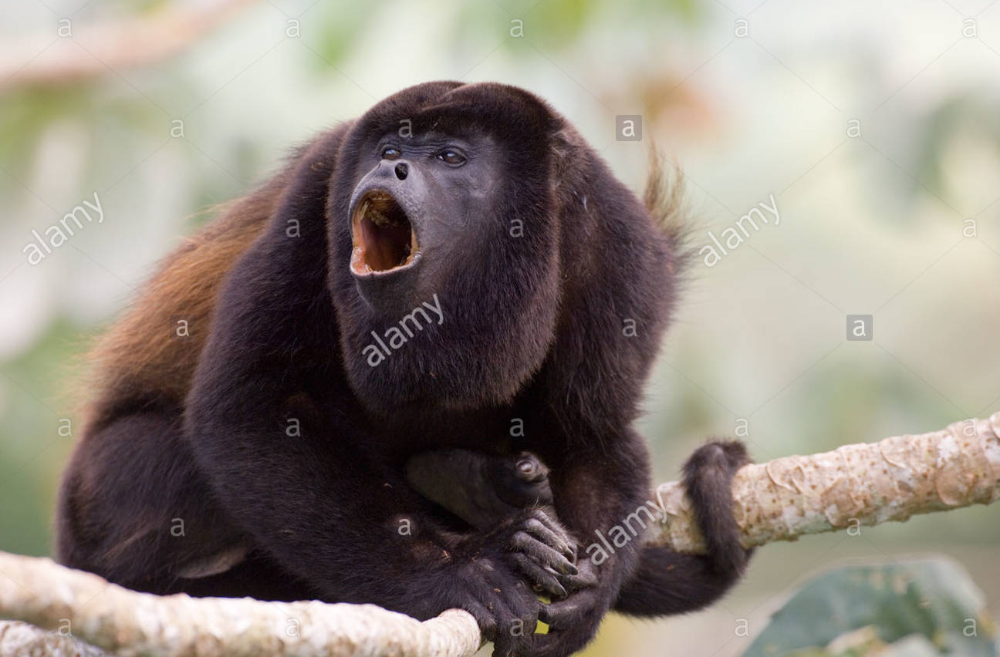

Labels is n1


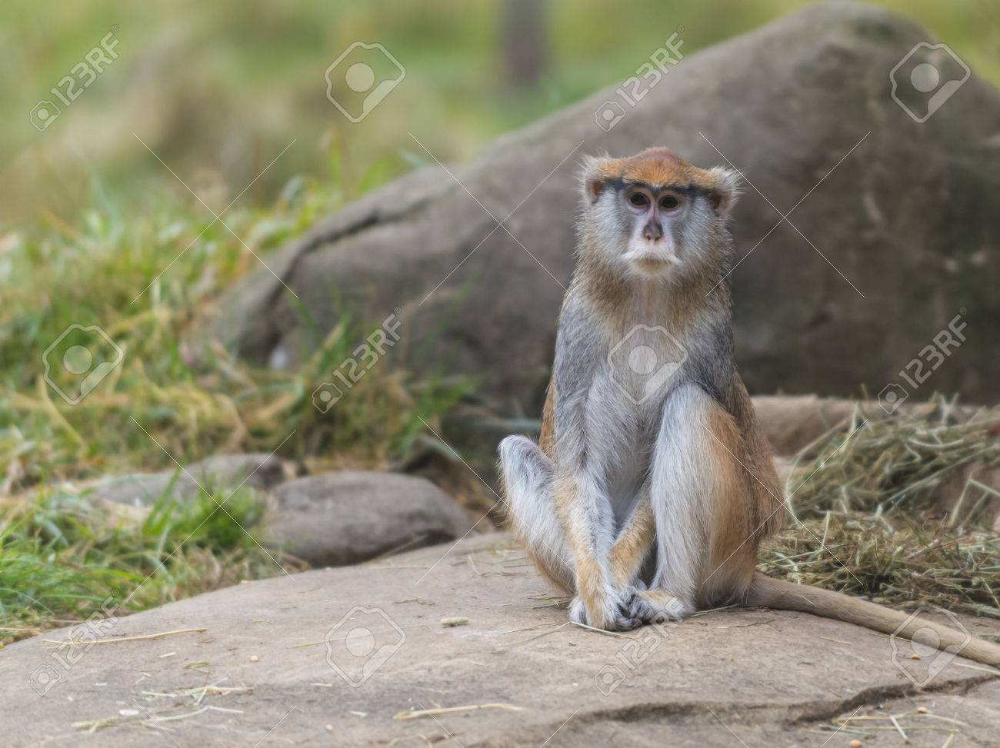

Labels is n2


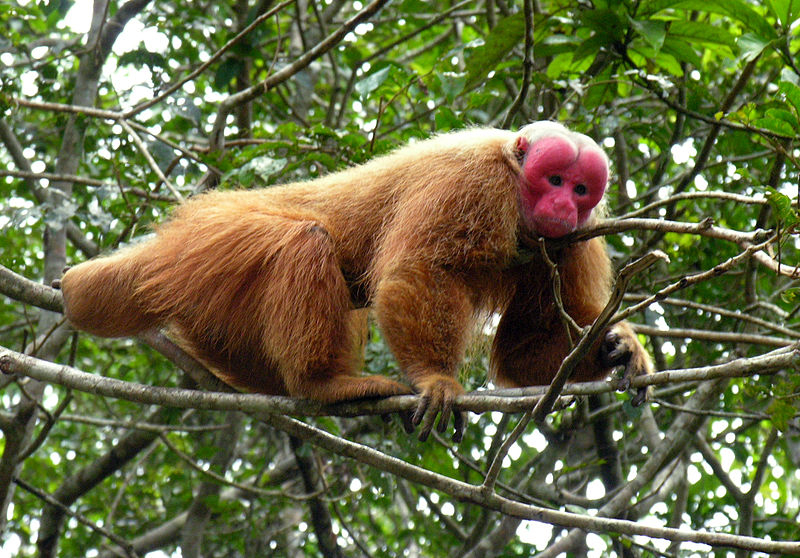

Labels is n3


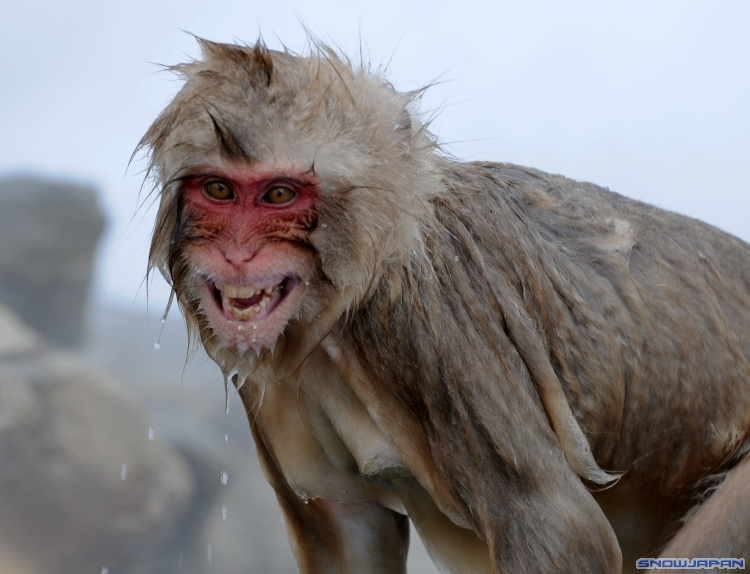

Labels is n4


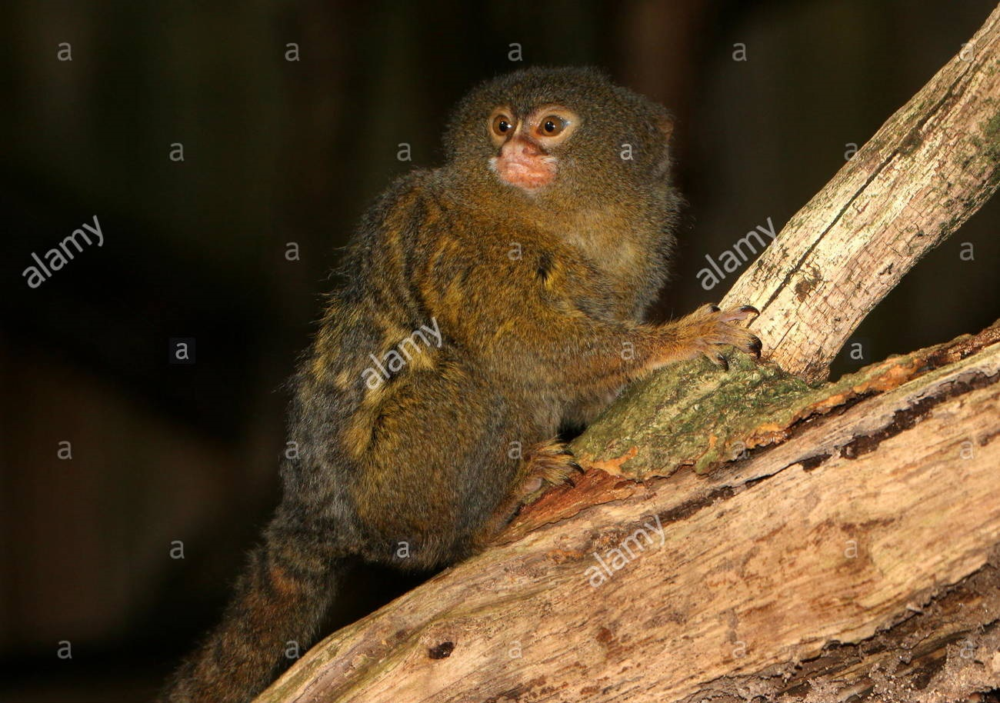

Labels is n5


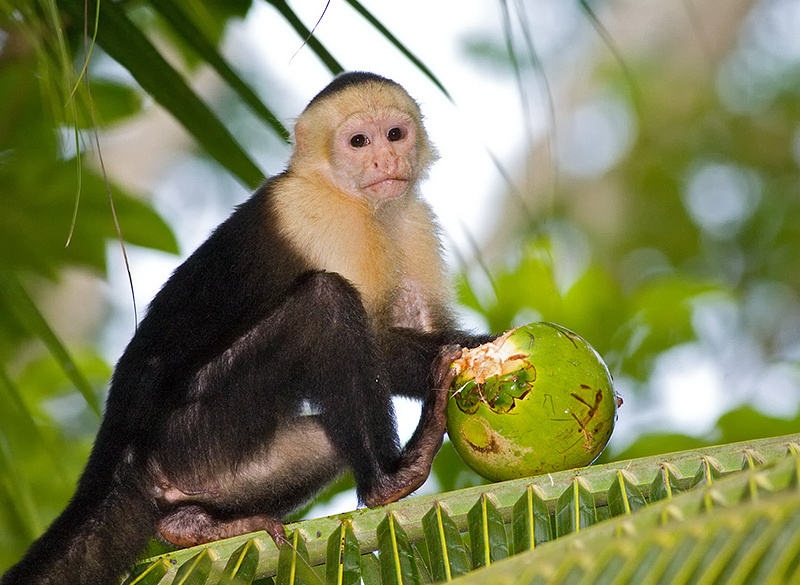

Labels is n6


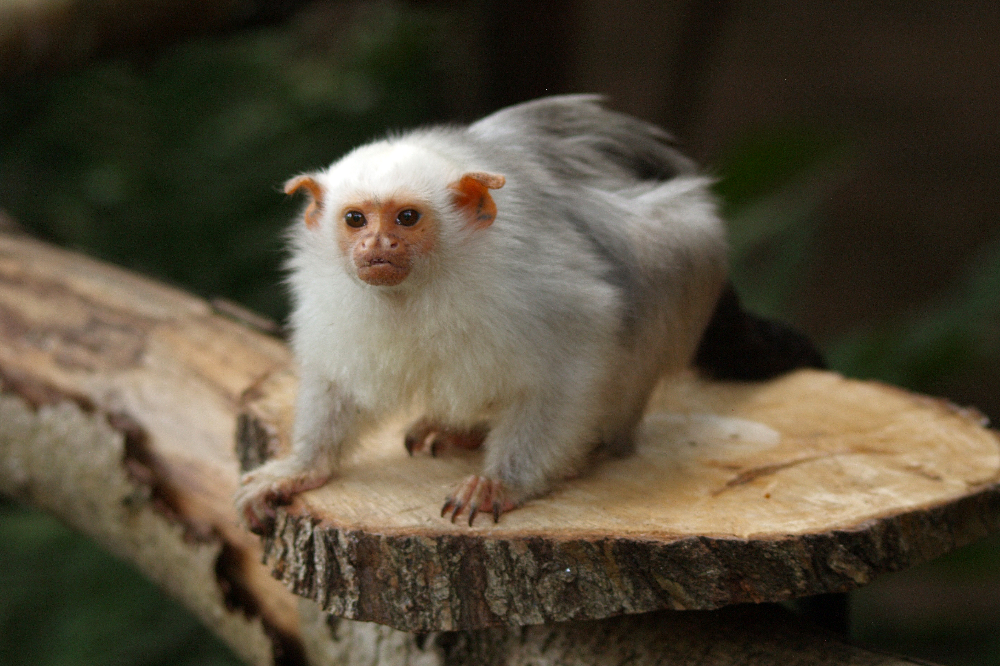

Labels is n7


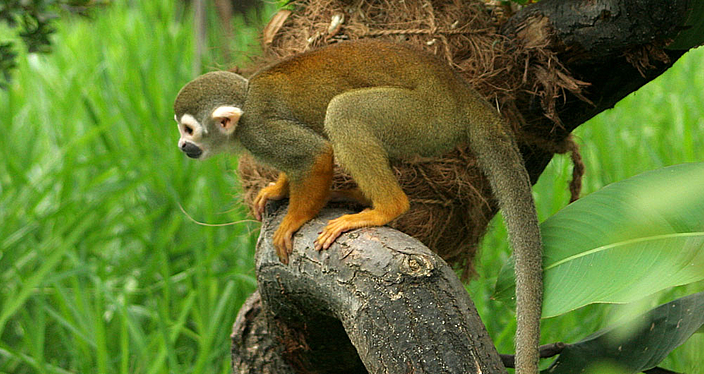

Labels is n8


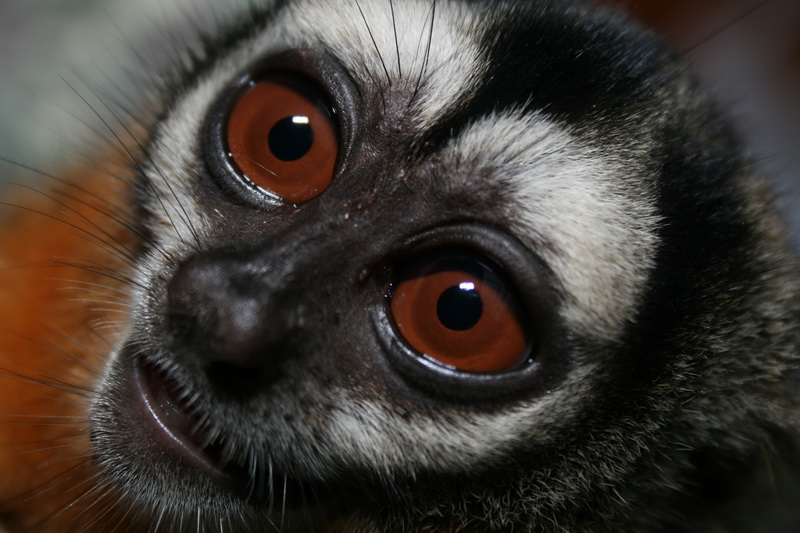

Labels is n9


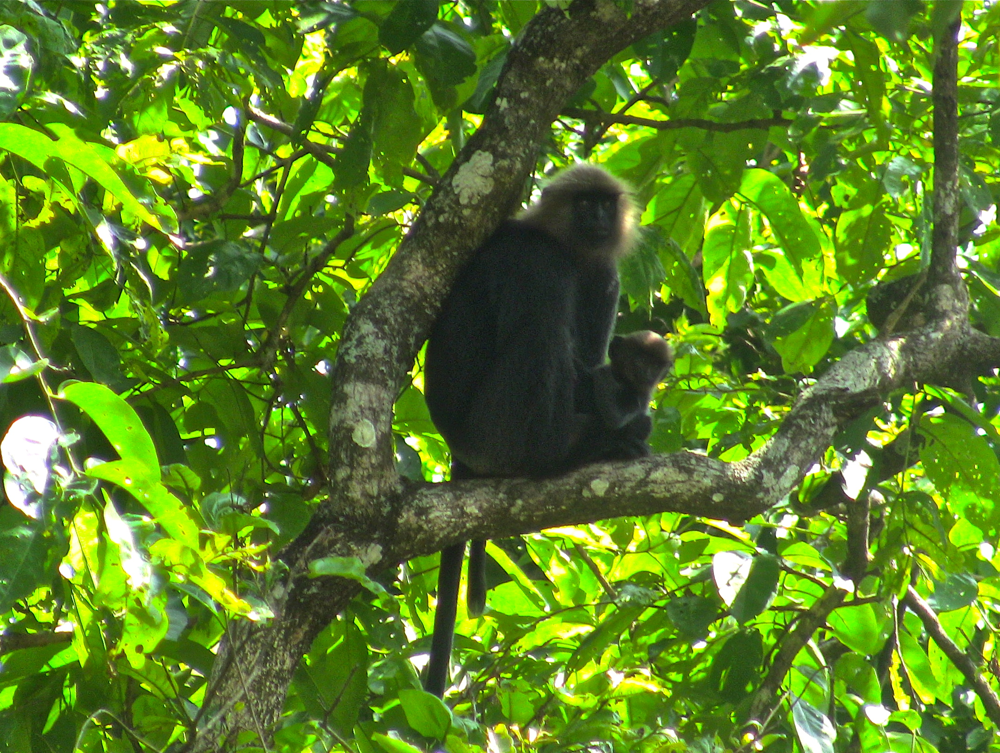

In [84]:
all_ids = labels["id"]

for my_id in labels["id"]:
    images_to_show = 5
    image_dir = TRAIN_DIR + "%s/" % my_id
    image_name = listdir(image_dir)[0]
    image_path = image_dir  + image_name
    print("Labels is %s" % my_id)
    display(Image(filename=image_path, width=300, height=300))

In [98]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
IMAGE_WIDTH = 300
IMAGE_HEIGHT = 300
BATCH_SIZE = 16

train_datagen = ImageDataGenerator(rescale=1./255,      # We need to normalize the data

                                  )

validation_datagen = ImageDataGenerator(rescale=1./255, # We need to normalize the data
                                  )

train_generator = train_datagen.flow_from_directory(TRAIN_DIR, 
                                                    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT), 
                                                    batch_size = BATCH_SIZE, 
                                                    shuffle=True, # By shuffling the images we add some randomness and prevent overfitting
                                                    class_mode="categorical")

validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR, 
                                                    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT), 
                                                    batch_size = BATCH_SIZE, 
                                                    shuffle=True,
                                                    class_mode="categorical")


Found 1100 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [100]:
train_generator[0][0].shape

(16, 300, 300, 3)

In [102]:
training_samples = 1100
validation_samples = 272
total_steps = training_samples

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D

model = Sequential()
model.add(Conv2D(200, kernel_size=(3,3), 
                activation='relu',input_shape=(300,300,3)))

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])
model.fit_generator(train_generator, steps_per_epoch=training_samples // BATCH_SIZE,
                                            epochs=25,
                                            validation_data=validation_generator,
                                            validation_steps=validation_samples // BATCH_SIZE)

Epoch 1/25


ValueError: Error when checking target: expected conv2d_45 to have 4 dimensions, but got array with shape (16, 10)